<a href="https://colab.research.google.com/github/vorobieva/ColabFold/blob/main/beta/ESMFold_melting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**ESMFold_melting**
for more details see: [Github](https://github.com/facebookresearch/esm/tree/main/esm), [Preprint](https://www.biorxiv.org/content/10.1101/2022.07.20.500902v1)

#### **Tips and Instructions**
- click the little ▶ play icon to the left of each cell below.

#### **Colab Limitations**
- On Tesla T4 (typical free colab GPU), max total length ~ 900



In [1]:
%%time
#@title install
#@markdown install ESMFold, OpenFold and download Params (~2min 30s)

import os, time
if not os.path.isfile("esmfold.model"):
  # download esmfold params
  os.system("apt-get install aria2 -qq")
  os.system("aria2c -q -x 16 https://colabfold.steineggerlab.workers.dev/esm/esmfold.model &")

  print("installing libs...")
  # install libs
  #os.system("pip install -q omegaconf pytorch_lightning biopython ml_collections einops py3Dmol")
  #os.system("pip install -q omegaconf \"pytorch_lightning<2\" \"torch<2\" biopython ml_collections einops py3Dmol")
  os.system("pip install -q omegaconf pytorch_lightning biopython ml_collections einops py3Dmol modelcif")
  os.system("pip install -q git+https://github.com/NVIDIA/dllogger.git")

  print("installing openfold...")
  # install openfold
  os.system(f"pip install -q git+https://github.com/sokrypton/openfold.git")
#  commit = "6908936b68ae89f67755240e2f588c09ec31d4c8"
#  os.system(f"pip install -q git+https://github.com/aqlaboratory/openfold.git@{commit}")

  # install esmfold
  os.system(f"pip install -q git+https://github.com/sokrypton/esm.git@beta")

  # wait for Params to finish downloading...
  if not os.path.isfile("esmfold.model"):
    # backup source!
    os.system("aria2c -q -x 16 https://files.ipd.uw.edu/pub/esmfold/esmfold.model")
  else:
    while os.path.isfile("esmfold.model.aria2"):
      time.sleep(5)

installing libs...
installing openfold...
CPU times: user 1.41 s, sys: 215 ms, total: 1.63 s
Wall time: 5min 27s


In [2]:
#@title ##run **ESMFold**
%%time
from string import ascii_uppercase, ascii_lowercase
import hashlib, re, os
import numpy as np
from jax.tree_util import tree_map
import matplotlib.pyplot as plt
from scipy.special import softmax
import json

def parse_output(output):
  pae = (output["aligned_confidence_probs"][0] * np.arange(64)).mean(-1) * 31
  plddt = output["plddt"][0,:,1]

  bins = np.append(0,np.linspace(2.3125,21.6875,63))
  sm_contacts = softmax(output["distogram_logits"],-1)[0]
  sm_contacts = sm_contacts[...,bins<8].sum(-1)
  xyz = output["positions"][-1,0,:,1]
  mask = output["atom37_atom_exists"][0,:,1] == 1
  o = {"pae":pae[mask,:][:,mask],
       "plddt":plddt[mask],
       "sm_contacts":sm_contacts[mask,:][:,mask],
       "xyz":xyz[mask]}
  if "contacts" in output["lm_output"]:
    lm_contacts = output["lm_output"]["contacts"].astype(float)[0]
    o["lm_contacts"] = lm_contacts[mask,:][:,mask]
  return o

def get_hash(x): return hashlib.sha1(x.encode()).hexdigest()
alphabet_list = list(ascii_uppercase+ascii_lowercase)

jobname = "TMB12_14_oval5" #@param {type:"string"}
jobname = jobname+"_melt"
jobname = re.sub(r'\W+', '', jobname)[:50]

sequence = "MQDSQGDAGGYFRVEYNTDNTFWAGPGGKYALSPHLFLDVAAGWNNSSLLKFDFHVKYFSPDGLEVQVGFTYNTDNTLVFFVVVVFWYDLSPHVKPYGRLEYRWNNSSLNKFFPGGGARYKLSPDLEVQADSGYNTDNTASTRFETVYKVSPEAEFKAGGQWNNSSLFKFQSQFDYKASS" #@param {type:"string"}
sequence = re.sub("[^A-Z:]", "", sequence.replace("/",":").upper())
sequence = re.sub(":+",":",sequence)
sequence = re.sub("^[:]+","",sequence)
sequence = re.sub("[:]+$","",sequence)

#@markdown ---
#@markdown ###**Advanced Options**
#@markdown The melting experiment was tested with 0 recycles
num_recycles = 0 #@param ["0", "1", "2", "3", "6", "12"] {type:"raw"}
get_LM_contacts = True #@param {type:"boolean"}

#@markdown **multimer options (experimental)**
#@markdown - use "/" to specify chainbreaks, (eg. sequence="AAA/AAA")
#@markdown - for homo-oligomeric predictions, set copies > 1

copies = 1 #@param {type:"integer"}
chain_linker = 25 #@param {type:"number"}
if copies == "" or copies <= 0: copies = 1
sequence = ":".join([sequence] * copies)

#@markdown **sampling options (experimental)**
#@markdown - Samples are generated via random masking of 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95 and 99% of the sequence
#@markdown - The melting experiment was tested with "LM stochastic mode" and 64 samples
#@markdown of input sequence (stochastic_mode="LM") and/or via dropout within structure module (stochastic_mode="SM").
masking_rate = [0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,0.99]
#@markdown Pre-set masking rates:
samples = 64 #@param ["None", "1", "4", "8", "16", "32", "64"] {type:"raw"}
#masking_rate = 0.45 #@param {type:"number"}
stochastic_mode = "LM" #@param ["LM", "LM_SM", "SM"]

ID = jobname+"_"+get_hash(sequence)[:5]
seqs = sequence.split(":")
lengths = [len(s) for s in seqs]
length = sum(lengths)
print("length",length)

u_seqs = list(set(seqs))
if len(seqs) == 1: mode = "mono"
elif len(u_seqs) == 1: mode = "homo"
else: mode = "hetero"

if "model" not in dir():
  import torch
  model = torch.load("esmfold.model")
  model.cuda().requires_grad_(False)

# optimized for Tesla T4
if length > 700:
  model.trunk.set_chunk_size(64)
else:
  model.trunk.set_chunk_size(128)

best_pdb_str = None
best_ptm = 0
best_output = None
traj = []

num_samples = 1 if samples is None else samples

best_models = dict()
os.system(f"mkdir -p {ID}")

success_rate=[]
mean_ptm = []
data_dict = {}

for mask in masking_rate:
  best_pdb_str = None
  best_ptm = 0.0
  best_output = None
  n_success = 0.0
  total_ptm = 0.0

  for seed in range(num_samples):
    torch.cuda.empty_cache()
    if samples is None:
      seed = "default"
      mask_rate = 0.0
      model.train(False)
    else:
      torch.manual_seed(seed)
      mask_rate = mask if "LM" in stochastic_mode else 0.0
      model.train("SM" in stochastic_mode)

    output = model.infer(sequence,
                       num_recycles=num_recycles,
                       chain_linker="X"*chain_linker,
                       residue_index_offset=512,
                       mask_rate=mask_rate,
                       return_contacts=get_LM_contacts)

    pdb_str = model.output_to_pdb(output)[0]
    output = tree_map(lambda x: x.cpu().numpy(), output)
    ptm = output["ptm"][0]
    plddt = output["plddt"][0,:,1].mean()
    traj.append(parse_output(output))
    print(f'{mask} {seed} ptm: {ptm:.3f} plddt: {plddt:.1f}')
    if ptm > best_ptm:
      best_pdb_str = pdb_str
      best_ptm = ptm
      best_output = output

    best_models[mask] = [best_pdb_str, best_ptm, best_output]

    if ptm >= 0.75:
      n_success += 1.0
    total_ptm += ptm

    if samples is None:
      pdb_filename = f"{ID}/ptm{ptm:.3f}_r{num_recycles}_{seed}.pdb"
    else:
      pdb_filename = f"{ID}/ptm{ptm:.3f}_r{num_recycles}_seed{seed}_{stochastic_mode}_m{mask:.2f}.pdb"

    with open(pdb_filename,"w") as out:
      out.write(pdb_str)

  success_rate.append(n_success/64.0)
  mean_ptm.append(total_ptm/64.0)

data_dict["masking"] = masking_rate
data_dict["success_rate"] = success_rate
data_dict["mean_ptm"] = mean_ptm

json_data = json.dumps(data_dict)
json_filename = f"{ID}/melting_data.json"
with open(json_filename,"w") as out:
  out.write(json_data)


length 180
0.3 0 ptm: 0.810 plddt: 83.9
0.3 1 ptm: 0.788 plddt: 82.8
0.3 2 ptm: 0.809 plddt: 84.0
0.3 3 ptm: 0.847 plddt: 86.5
0.3 4 ptm: 0.815 plddt: 85.1
0.3 5 ptm: 0.818 plddt: 83.3
0.3 6 ptm: 0.838 plddt: 86.0
0.3 7 ptm: 0.842 plddt: 85.9
0.3 8 ptm: 0.833 plddt: 86.1
0.3 9 ptm: 0.830 plddt: 85.0
0.3 10 ptm: 0.824 plddt: 84.8
0.3 11 ptm: 0.822 plddt: 84.9
0.3 12 ptm: 0.805 plddt: 83.6
0.3 13 ptm: 0.808 plddt: 85.1
0.3 14 ptm: 0.810 plddt: 84.1
0.3 15 ptm: 0.792 plddt: 83.1
0.3 16 ptm: 0.842 plddt: 85.9
0.3 17 ptm: 0.816 plddt: 84.6
0.3 18 ptm: 0.842 plddt: 86.2
0.3 19 ptm: 0.779 plddt: 81.9
0.3 20 ptm: 0.839 plddt: 86.1
0.3 21 ptm: 0.838 plddt: 85.7
0.3 22 ptm: 0.797 plddt: 84.6
0.3 23 ptm: 0.801 plddt: 83.5
0.3 24 ptm: 0.804 plddt: 83.4
0.3 25 ptm: 0.822 plddt: 84.9
0.3 26 ptm: 0.825 plddt: 83.8
0.3 27 ptm: 0.825 plddt: 85.3
0.3 28 ptm: 0.805 plddt: 84.2
0.3 29 ptm: 0.722 plddt: 77.9
0.3 30 ptm: 0.830 plddt: 85.4
0.3 31 ptm: 0.801 plddt: 82.6
0.3 32 ptm: 0.827 plddt: 85.1
0.3 33 pt

KeyboardInterrupt: 

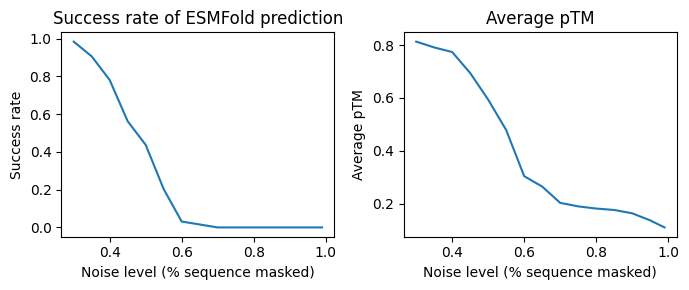

In [ ]:
#@title display melting curves (optional) {run: "auto"}

dpi = 100 #@param {type:"integer"}

def plot_melting(data_dict, dpi=100):
  plt.figure(figsize=(7,3), dpi=dpi)
  plt.subplot(1,2,1)

  plt.title('Success rate of ESMFold prediction')
  plt.plot(data_dict["masking"], data_dict["success_rate"])
#  if Ls is not None:
#    L_prev = 0
#    for L_i in Ls[:-1]:
#      L = L_prev + L_i
#      L_prev += L_i
#      plt.plot([L,L],[0,100],color="black")
#  plt.xlim(0,O["plddt"].shape[0])
#  plt.ylim(0,100)
  plt.ylabel('Success rate')
  plt.xlabel('Noise level (% sequence masked)')

  plt.subplot(1,2,2)
  plt.title('Average pTM')
  plt.plot(data_dict["masking"], data_dict["mean_ptm"])
#  Ln = O["pae"].shape[0]
#  plt.imshow(O["pae"],cmap="bwr",vmin=0,vmax=30,extent=(0, Ln, Ln, 0))
#  if Ls is not None and len(Ls) > 1: plot_ticks(Ls)
#  plt.colorbar()
  plt.xlabel('Noise level (% sequence masked)')
  plt.ylabel('Average pTM')

plot_melting(data_dict=data_dict, dpi=dpi)
plt.tight_layout()

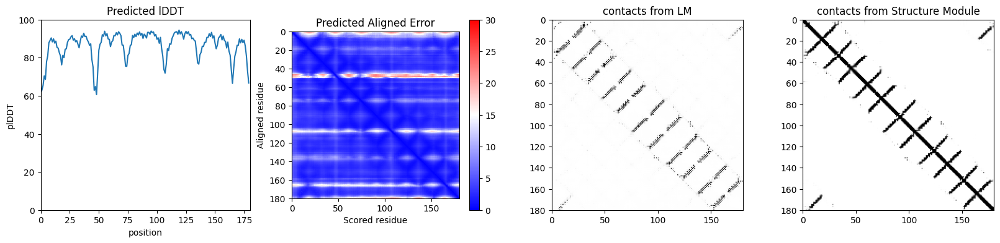

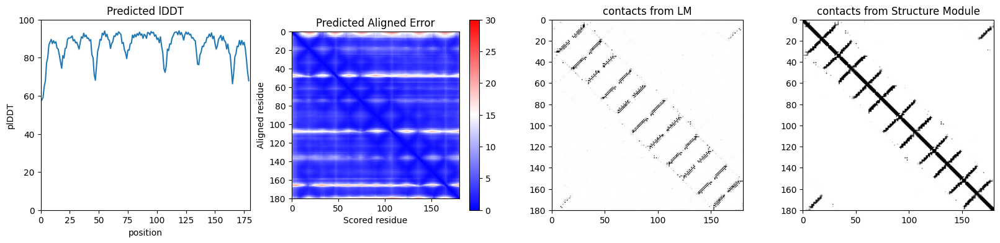

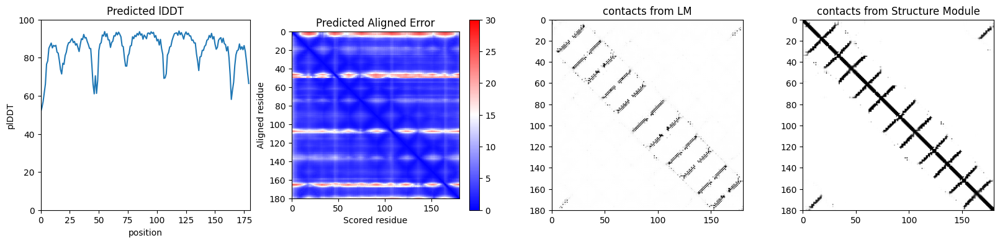

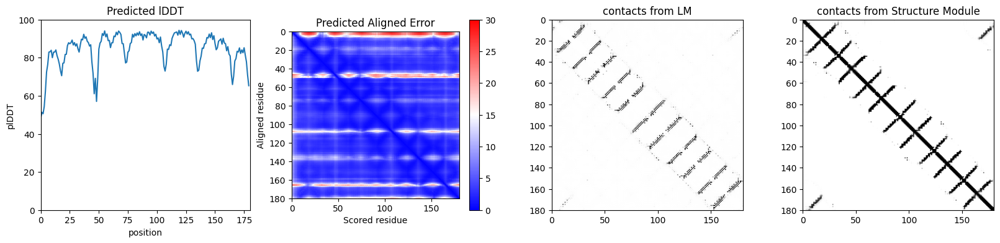

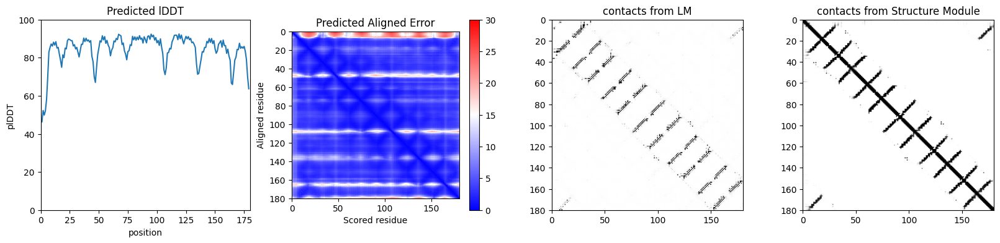

...

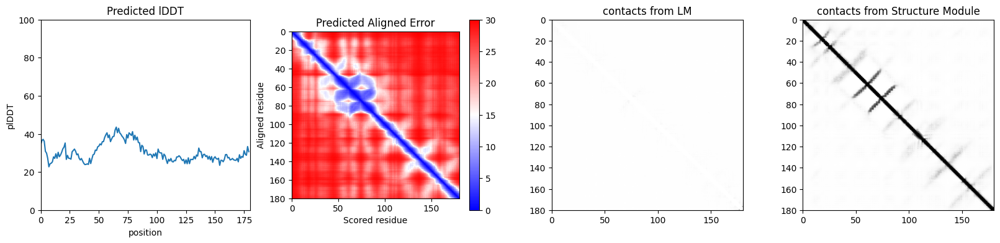

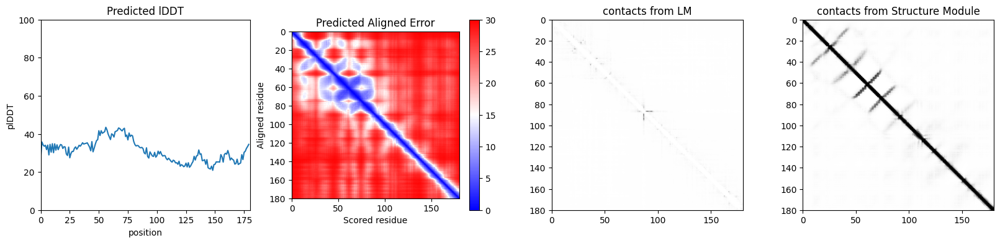

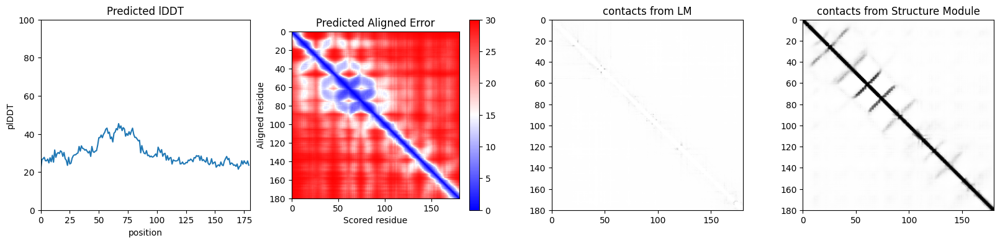

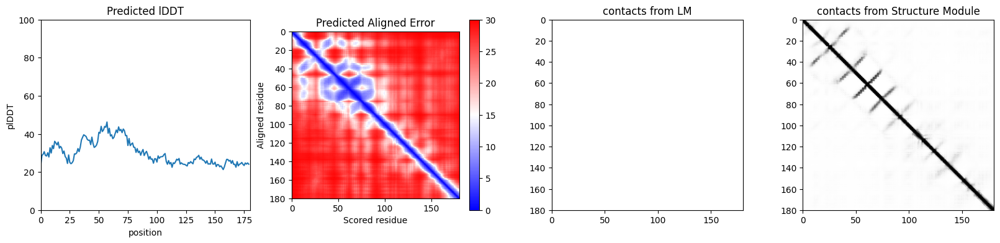

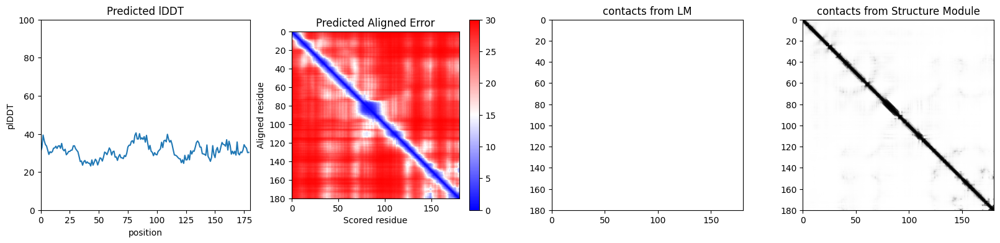

In [ ]:
#@title plot confidence and contacts of max pTM model (optional)

dpi = 100 #@param {type:"integer"}

def plot_ticks(Ls):
  Ln = sum(Ls)
  L_prev = 0
  for L_i in Ls[:-1]:
    L = L_prev + L_i
    L_prev += L_i
    plt.plot([0,Ln],[L,L],color="black")
    plt.plot([L,L],[0,Ln],color="black")
  ticks = np.cumsum([0]+Ls)
  ticks = (ticks[1:] + ticks[:-1])/2
  plt.yticks(ticks,alphabet_list[:len(ticks)])

def plot_confidence(output, Ls=None, dpi=100):
  O = parse_output(output)
  if "lm_contacts" in O:
    plt.figure(figsize=(20,4), dpi=dpi)
    plt.subplot(1,4,1)
  else:
    plt.figure(figsize=(15,4), dpi=dpi)
    plt.subplot(1,3,1)

  plt.title('Predicted lDDT')
  plt.plot(O["plddt"])
  if Ls is not None:
    L_prev = 0
    for L_i in Ls[:-1]:
      L = L_prev + L_i
      L_prev += L_i
      plt.plot([L,L],[0,100],color="black")
  plt.xlim(0,O["plddt"].shape[0])
  plt.ylim(0,100)
  plt.ylabel('plDDT')
  plt.xlabel('position')
  plt.subplot(1,4 if "lm_contacts" in O else 3,2)

  plt.title('Predicted Aligned Error')
  Ln = O["pae"].shape[0]
  plt.imshow(O["pae"],cmap="bwr",vmin=0,vmax=30,extent=(0, Ln, Ln, 0))
  if Ls is not None and len(Ls) > 1: plot_ticks(Ls)
  plt.colorbar()
  plt.xlabel('Scored residue')
  plt.ylabel('Aligned residue')

  if "lm_contacts" in O:
    plt.subplot(1,4,3)
    plt.title("contacts from LM")
    plt.imshow(O["lm_contacts"],cmap="Greys",vmin=0,vmax=1,extent=(0, Ln, Ln, 0))
    if Ls is not None and len(Ls) > 1: plot_ticks(Ls)
    plt.subplot(1,4,4)
  else:
    plt.subplot(1,3,3)
  plt.title("contacts from Structure Module")
  plt.imshow(O["sm_contacts"],cmap="Greys",vmin=0,vmax=1,extent=(0, Ln, Ln, 0))
  if Ls is not None and len(Ls) > 1: plot_ticks(Ls)
  return plt

for mask in masking_rate:
  plot_confidence(best_models[mask][2], Ls=lengths, dpi=dpi)
  plt_filename = f"{ID}/m.0.{mask}.png"
  plt.savefig(plt_filename)
  plt.show()

In [ ]:
#@title download predictions
from google.colab import files
os.system(f"zip {ID}.zip {ID}/*")
files.download(f'{ID}.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#@title animate outputs (optional)
#@markdown if more than one sample generated
import os
if not os.path.isdir("colabfold"):
  os.system("git clone https://github.com/sokrypton/ColabFold.git")
import ColabFold.beta.colabfold as cf

dpi =  100#@param {type:"integer"}
color_by_plddt = True #@param {type:"boolean"}
use_pca = True
cycle = True

import matplotlib
from matplotlib import animation
from IPython.display import HTML
from sklearn.decomposition import PCA

def mk_animation(xyz, labels, plddt, ref=0, Ls=None, line_w=2.0, dpi=100,color_by_plddt=False):

  def ca_align_to_last(positions, ref):
    def align(P, Q):
      if Ls is None or len(Ls) == 1:
        P_,Q_ = P,Q
      else:
        # align relative to first chain
        P_,Q_ = P[:Ls[0]],Q[:Ls[0]]
      p = P_ - P_.mean(0,keepdims=True)
      q = Q_ - Q_.mean(0,keepdims=True)
      return ((P - P_.mean(0,keepdims=True)) @ cf.kabsch(p,q)) + Q_.mean(0,keepdims=True)

    pos = positions[ref] - positions[ref].mean(0,keepdims=True)
    best_2D_view = pos @ cf.kabsch(pos,pos,return_v=True)

    new_positions = []
    for i in range(len(positions)):
      new_positions.append(align(positions[i],best_2D_view))
    return np.asarray(new_positions)

  # align to reference
  pos = ca_align_to_last(xyz, ref)

  fig, (ax1) = plt.subplots(1)
  fig.set_figwidth(5)
  fig.set_figheight(5)
  fig.set_dpi(dpi)

  xy_min = pos[...,:2].min() - 1
  xy_max = pos[...,:2].max() + 1

  for ax in [ax1]:
    ax.set_xlim(xy_min, xy_max)
    ax.set_ylim(xy_min, xy_max)
    ax.axis(False)

  ims=[]
  for l,pos_,plddt_ in zip(labels,pos,plddt):
    if color_by_plddt:
      img = cf.plot_pseudo_3D(pos_, c=plddt_, cmin=50, cmax=90, line_w=line_w, ax=ax1)
    elif Ls is None or len(Ls) == 1:
      img = cf.plot_pseudo_3D(pos_, ax=ax1, line_w=line_w)
    else:
      c = np.concatenate([[n]*L for n,L in enumerate(Ls)])
      img = cf.plot_pseudo_3D(pos_, c=c, cmap=cf.pymol_cmap, cmin=0, cmax=39, line_w=line_w, ax=ax1)
    ims.append([cf.add_text(f"{l}", ax1),img])

  ani = animation.ArtistAnimation(fig, ims, blit=True, interval=120)
  plt.close()
  return ani.to_html5_video()

labels = np.array([f"seed:{x}" for x in range(len(traj))])
pos = np.array([x["xyz"] for x in traj])
plddt = np.array([x["plddt"] for x in traj])
if use_pca and pos.shape[0] > 1:
  pos_ca = pos
  if lengths is not None and len(lengths) > 1:
    pos_ca = pos_ca[:,:lengths[0]]
  i,j = np.triu_indices(pos_ca.shape[1],k=1)
  pos_ca_dm = np.sqrt(np.square(pos_ca[:,None,:,:] - pos_ca[:,:,None]).sum(-1))[:,i,j]
  pc = PCA(1).fit_transform(pos_ca_dm)[:,0].argsort()
  if cycle:
    pc = np.append(pc,pc[1:-1][::-1])
  pos = pos[pc]
  labels = labels[pc]
  plddt = plddt[pc]
HTML(mk_animation(pos, labels, plddt, Ls=lengths, dpi=dpi, color_by_plddt=color_by_plddt))